<div class="alert alert-info">

## Information
- Your solutions to this exercise need to be **submitted by the end of the week**. 
- The Jupyter Notebook contains code snippets that help you to get started (marked via `DO NOT CHANGE`). Please don't change these code snippets. 

# Part 1

In [2]:
import pandas as pd
import geopandas as gpd
import plotly.express as px
import matplotlib.pyplot as plt

In [3]:
# --- DO NOT CHANGE ----
cars = pd.read_csv('used_cars.csv')

fig = px.scatter_map(cars, lat="latitude", lon="longitude", hover_data=["price", "make", "model"])

fig.update_layout(map=dict(style="open-street-map", zoom=5),
                  height=700, width=600, 
                  margin={"r":0,"t":0,"l":0,"b":0} )


Zoom into the map until you can see details about Kiel, and where in Kiel cars are being sold. Then turn off your internet connection, reload the map, and again zoom into Kiel and then München. What differences do you see? And why do you think these differences occur?

**Observation**
- the map of Kiel looks the same, dots are also at the same spots
- map of munich does not load properly, but the dots are there and also react to the zooming
- there is even a white square between Munich and Karlsruhe that does not load at all

**Explanation**
- the map is fetched from OpenStreetMap which probably uses a tile-based system
- different zoom levels require different tiles
- tiles are fetched and cached depending on what you are looking at and how far you zoom in
- when offline, only cached tiles can be displayed

$\rightarrow$ Kiel zoomed-in tiles where cached and could be viewed offline but since i didn't zoom in to Munich at all before, no tiles were cached for it and i couldn't zoom in offline

Create a scatter map that makes the `price` of the used cars visible via the color and size of the markers.

In [4]:
fig = px.scatter_map(cars, lat="latitude", lon="longitude", color="price", size="price", 
                     hover_data=["price", "make", "model"], color_continuous_scale="RdYlGn_r")

fig.update_layout(map=dict(style="open-street-map", zoom=5),
                  height=700, width=600, 
                  margin={"r":0,"t":0,"l":0,"b":0},
                  coloraxis_colorbar=dict(
                    title="Price [€]",
                    thickness=25,
                    xanchor="left",
                    yanchor="middle",
                ))

Create a scatter map that makes the `make` of the cars visible via the color, but only for the makes "porsche", "ferrari", and "maserati".

In [5]:
# Filter for only the three luxury makes
luxury_cars = cars[cars['make'].isin(['porsche', 'ferrari', 'maserati'])]

color_map = {
    'porsche': '#9a1f38',
    'ferrari': '#389a1f',
    'maserati': '#1f389a',
    'other': '#857984'
}

fig = px.scatter_map(luxury_cars, 
                     lat="latitude", 
                     lon="longitude", 
                     color="make",
                     color_discrete_map=color_map,
                     hover_data=["price", "make", "model"],
                     labels={'make': 'Car Brand'})

fig.update_layout(map=dict(style="open-street-map", zoom=5),
                  height=700, width=600, 
                  margin={"r":0,"t":0,"l":0,"b":0})

In [6]:
cars['brand'] = cars['make'].apply(
    lambda x: x if x in ['porsche', 'ferrari', 'maserati'] else 'other'
)

fig = px.scatter_map(cars, 
                     lat="latitude", 
                     lon="longitude", 
                     color="brand",
                     color_discrete_map=color_map,
                     hover_data=["price", "make", "model"],
                     labels={'brand': 'Car Brand'})

fig.update_layout(map=dict(style="open-street-map", zoom=5),
                  height=700, width=600, 
                  margin={"r":0,"t":0,"l":0,"b":0})

Reflect: What are the strengths of such scatter maps created with plotly express? What are good use cases? What are the limitations?

**Strength**
- Interactivity (Zoom, Hover, etc.)
- Interactivity also helps with dense data (eg. overlapping points distinguishable with hover info)
- Easy integration of OpenStreetMap
- Easy encoding of multiple variables in color, size etc. 

**Use Cases**
- Exploratory data analysis
    - Since it's fast to produce initial plots
    - Especially for complex datasets
- Dashboards (due to interactivity)
- Presentations (eg. live zooming to specific regions)


**Limitations**
- Not suitable for papers, reports, printed media
- File size can get large
- Can easily get too complex or overloaded
- Internet connection sometimes needed (eg. Basemap)

# Part 2

Your task is to create a **static, thematic map showing aggregate geographic patterns**. In particular, you should create a **choropleth map** that visualizes the <u>median price of used cars per German Bundesland (federal state)</u>. The high-level steps to achieve this are as follows:

1. Find and download a suitable shapefile that contains the geometries of German Bundesländer
2. Assign each car to its corresponding Bundesland based on its geographic coordinates (longitude, latitude).
3. Calculate the median price per Bundesland.
4. Create a choropleth map of median prices per Bundesland

## 2.1 German Bundesländer

- Eurostat provides shapefiles for regions in Europe at different levels of detail (NUTS levels).
- You can download the shapefiles from the Eurostat website: https://ec.europa.eu/eurostat/web/gisco/geodata/statistical-units/territorial-units-statistics
- For this exercise, select:
    * NUTS year: 2024 (i.e. the most recent version)
    * file format: geojson
    * Geometry type: polygons
    * Scale: 10M (i.e. a compromise between detail and file size)
    * Coordinate Reference System: EPSG:3035

In [7]:
# Read in the GeoJSON file: you must of course input your filename here
europe = gpd.read_file('NUTS_RG_10M_2024_3035.geojson')

Display the first five rows of the GeoDataFrame to understand its structure and contents

In [8]:
europe.head()

,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,geometry
0,AT127,3,AT,Wiener Umland/Südteil,Wiener Umland/Südteil,NaN,2.0,NaN,"POLYGON ((4761472.615 2792467.94, 4766617.881 ..."
1,AT130,3,AT,Wien,Wien,NaN,1.0,NaN,"POLYGON ((4780587.347 2803485.343, 4782059.324..."
2,AT211,3,AT,Klagenfurt-Villach,Klagenfurt-Villach,1.0,2.0,NaN,"POLYGON ((4589828.59 2612229.34, 4593407.991 2..."
3,AT212,3,AT,Oberkärnten,Oberkärnten,1.0,3.0,NaN,"POLYGON ((4530306.2 2617285.815, 4527096.513 2..."
4,AT213,3,AT,Unterkärnten,Unterkärnten,1.0,3.0,NaN,"POLYGON ((4621593.145 2655568.151, 4639616.664..."


In which units are the geometries represented - longitude/latitude or meters? Use the `crs` attribute of the `europe` object to find out.

In [9]:
europe.crs.axis_info

[Axis(name=Northing, abbrev=Y, direction=north, unit_auth_code=EPSG, unit_code=9001, unit_name=metre),
 Axis(name=Easting, abbrev=X, direction=east, unit_auth_code=EPSG, unit_code=9001, unit_name=metre)]

The geometries are represented in meters.

In [10]:
europe.crs.to_epsg()

3035

Use the `plot` method of GeoDataFrames to visualize the shapes of the European regions

Text(44.347222222222214, 0.5, 'Latitude [m]')

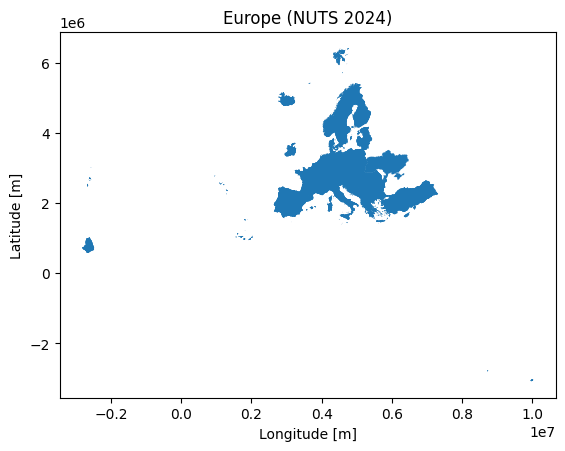

In [11]:
europe.plot()
plt.title("Europe (NUTS 2024)")
plt.xlabel("Longitude [m]")
plt.ylabel("Latitude [m]")

- Restrict the `GeoDataFrame` to **Germany** and to the **NUTS Level 3**. You can use standard pandas-type filtering for this. 
- Then `plot` the resulting `GeoDataFrame`. 
- In how many regions is Germany divided at NUTS level 3?

Number of NUTS 3 regions in Germany: 400


Text(154.41140692696948, 0.5, 'Latitude [m]')

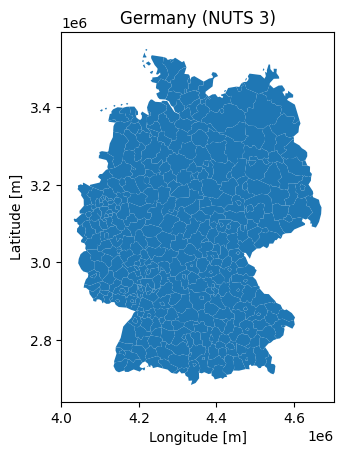

In [12]:
germany_nuts3 = europe[(europe['CNTR_CODE'] == 'DE') & (europe['LEVL_CODE'] == 3)]

print(f"Number of NUTS 3 regions in Germany: {len(germany_nuts3)}")

germany_nuts3.plot()
plt.title("Germany (NUTS 3)")
plt.xlabel("Longitude [m]")
plt.ylabel("Latitude [m]")

Repeat the previous tasks for NUTS level 1. In how many regions is Germany divided at NUTS level 1? What does NUTS level 1 correspond to in Germany?

Number of NUTS 1 regions in Germany: 16


Text(154.41140692696948, 0.5, 'Latitude [m]')

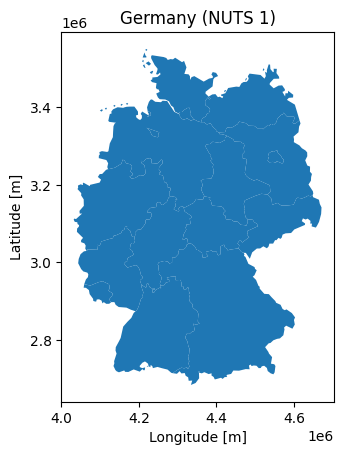

In [13]:
germany_nuts1 = europe[(europe['CNTR_CODE'] == 'DE') & (europe['LEVL_CODE'] == 1)]

print(f"Number of NUTS 1 regions in Germany: {len(germany_nuts1)}")

germany_nuts1.plot()
plt.title("Germany (NUTS 1)")
plt.xlabel("Longitude [m]")
plt.ylabel("Latitude [m]")

In [14]:
print(germany_nuts1[['NUTS_ID', 'NUTS_NAME']].to_string(index=False))

NUTS_ID              NUTS_NAME
    DE9          Niedersachsen
    DEA    Nordrhein-Westfalen
    DEB        Rheinland-Pfalz
    DEC               Saarland
    DED                Sachsen
    DEE         Sachsen-Anhalt
    DEF     Schleswig-Holstein
    DEG              Thüringen
    DE1      Baden-Württemberg
    DE2                 Bayern
    DE3                 Berlin
    DE4            Brandenburg
    DE5                 Bremen
    DE6                Hamburg
    DE7                 Hessen
    DE8 Mecklenburg-Vorpommern


NUTS Level 1 shows the Bundesländer of Germany.

## 2.2 Assign cars to regions

- Current status: So far, we have (1) the coordinates of each car offering (longitude and latitude), and (2) the coordinates (in form of polygons or multipolygons) of German regions (NUTS1, ...).  
- Our goal: We want to know which car is located in which Bundesland 

**Step 1:** We convert the car DataFrame into a GeoDataFrame

Important: Typically, if data comes with longitude and latitude information, it is based on the coordinate reference system "EPSG:4326" (the system on which GPS is based).

In [15]:
# --- DO NOT CHANGE ----

cars_geo = gpd.GeoDataFrame(data = cars, 
                            geometry = gpd.points_from_xy(cars.longitude, cars.latitude), 
                            crs = "EPSG:4326")

Visualize the `cars_geo` GeoDataFrame, using the `plot` method.

Text(151.3283246897943, 0.5, 'Latitude [°]')

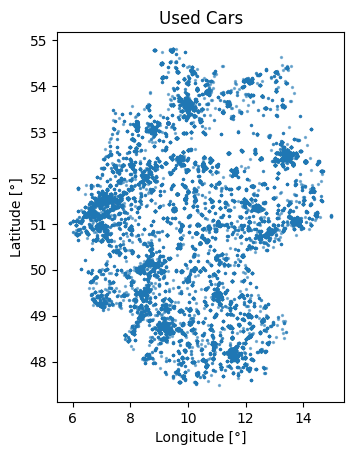

In [16]:
cars_geo.plot(markersize=2, alpha=0.5)
plt.title("Used Cars")
plt.xlabel("Longitude [°]")
plt.ylabel("Latitude [°]")

**Step 2**: Align the coordinate reference systems (CRS) of both GeoDataFrames

- Currently, the coordinate reference system of the `cars_geo` GeoDataFrame is **EPSG:4326** (in units longitude/latitude), while the CRS of the `nuts1` GeoDataFrame is **EPSG:3035** (in units meters). EPSG:3035 is more suitable for spatial operations in Europe, because it uses meters as units and minimizes distortions in Europe.
- Use the `to_crs` method, to convert the `cars_geo` GeoDataFrame to EPSG:3035.

In [17]:
cars_geo = cars_geo.to_crs("EPSG:3035")
cars_geo.crs

<Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Türkiye (Turkey); United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.58, 24.6, 44.83, 84.73)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azimuthal Equal Area
Datum: Eur

**Step 3:** Perform a spatial join to associate each car with its corresponding Bundesland.

Hints:

- Use the `sjoin` function from geopandas.
- As output, we want to keep all cars, even if they cannot be assigned to a Bundesland. (Which join type is appropriate for this? left, right, inner?)
- Which spatial predicate is appropriate here? (within, contains, touches, intersects, ...?)

In [18]:
cars_region = gpd.sjoin(cars_geo, germany_nuts1, how='left', predicate='within')

# left join to keep all cars (even those not assigned to a Bundesland)
# within predicate to find which Bundesland each car point is within

Visually verify whether the spatial join was successful: Use the `plot` method to create a map that colors the cars according to their assigned Bundesland. You can use the `column` argument of the `plot` method to specify the column according to which the points should be colored.

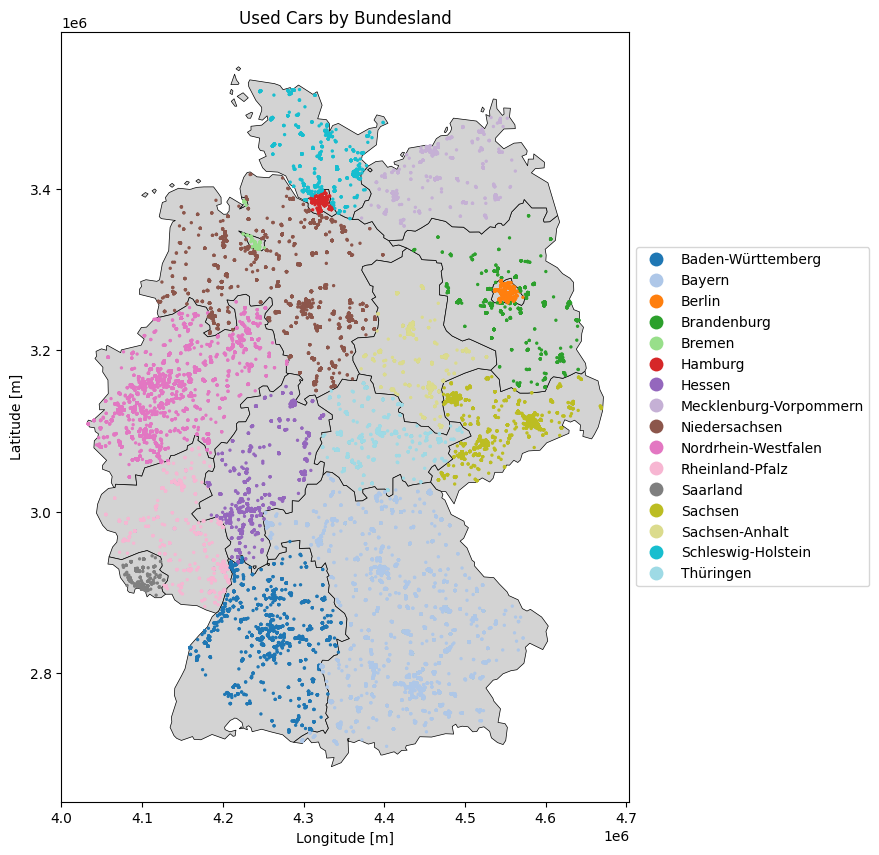

In [19]:
fig, ax = plt.subplots(figsize=(12, 10))
germany_nuts1.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
cars_region.plot(ax=ax, column='NUTS_NAME', cmap='tab20', markersize=2, legend=True,
                 legend_kwds={'loc': 'center left', 'bbox_to_anchor': (1, 0.5)})
plt.title("Used Cars by Bundesland")
plt.xlabel("Longitude [m]")
plt.ylabel("Latitude [m]")
plt.show()

## 2.3 Median Price per Bundesland

- Now we should know for all (or at least most) cars, in which Bundesland they are located.
- Next, calculate the median price of used cars per Bundesland. (Hint: This is not a geospatial operation, but a standard pandas groupby operation.)
- As output, you should get a normal DataFrame with two columns: one for the Bundesland name, and one for the median price.

In [20]:
median_prices = cars_region.groupby('NUTS_NAME')['price'].median().reset_index()
median_prices.columns = ['Bundesland', 'median_price']

# Sort by median price
median_prices = median_prices.sort_values('median_price', ascending=False)

print("Median price per Bundesland:")
print(median_prices.to_string(index=False))

Median price per Bundesland:
            Bundesland  median_price
                Bayern       25500.0
     Baden-Württemberg       25490.0
                Hessen       25490.0
         Niedersachsen       24472.5
   Nordrhein-Westfalen       23990.0
             Thüringen       23990.0
        Sachsen-Anhalt       23490.0
                Berlin       22990.0
           Brandenburg       22847.5
Mecklenburg-Vorpommern       22060.0
               Sachsen       21890.0
       Rheinland-Pfalz       21337.5
               Hamburg       20935.0
    Schleswig-Holstein       20770.0
                Bremen       17990.0
              Saarland       12925.0


## 2.4 Visualize median prices per Bundesland

- To visualize the average price of used cars per Bundesland, we need merge the aggregated data from exercise 2.3 with the GeoDataFrame that contains the geometries of the Bundesländer.
- Note: this is not a spatial join, but a "attribute" join based on the name of the Bundesland.
- Then create a choropleth map using the `plot` method of the GeoDataFrame. Use the column with the median prices to color the Bundesländer. The map should have a title and a legend.

In [21]:
nuts1_with_prices = germany_nuts1.merge(median_prices, left_on='NUTS_NAME', right_on='Bundesland', how='left')

print(f"Merged data shape: {nuts1_with_prices.shape}")

Merged data shape: (16, 11)


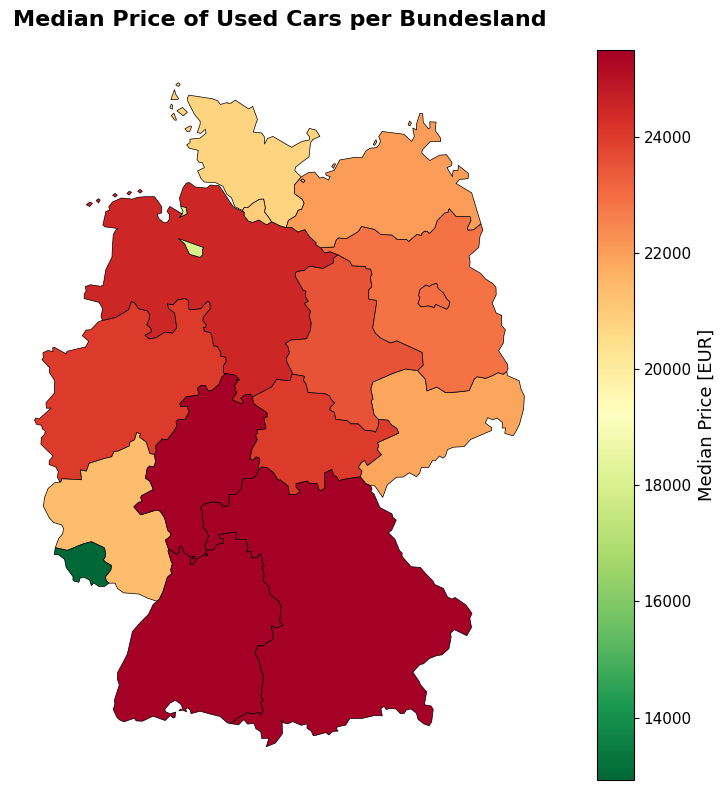

In [22]:
fig, ax = plt.subplots(figsize=(10, 8))

nuts1_with_prices.plot(
    column='median_price',
    ax=ax,
    legend=True,
    cmap='RdYlGn_r',
    edgecolor='black',
    linewidth=0.5,
    legend_kwds={'label': 'Median Price [EUR]', 'orientation': 'vertical'}
)
cbar = ax.get_figure().axes[-1]
cbar.set_ylabel('Median Price [EUR]', fontsize=13)
cbar.tick_params(labelsize=11)

plt.title('Median Price of Used Cars per Bundesland', fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

Do you observe an interesting geospatial pattern in the distribution of car prices?

- Southern Germany
    - highest prices are found here
    - especially in Bavaria, and Baden-Württemberg
    - home to luxury car manufacturers like BMW, Mercedes etc.
    - wealthiest regions of Germany (as far as i know)
- West vs. East
    - Eastern states show medium to low prices (especially MV, Sachsen)
    - Western states have medium to high prices (especially Hessen, Bavaria, BaWü)
- Lowest prices
    - Saarland, Bremen, SH, Hamburg & Rheinland-Pfalz
    - in city-states (Hamburg & Bremen) cars are probably not needed as much due to good public transport
    - in border regions (Saarland, Rheinland-Pfalz) people may buy cars from abroard (France)
    - rural regions (SH, MV etc.) have lower population density and incomes